## Installing Packages

In this section I install the packages I will be needing. I install arcgis for geocoding as well as Geoff Boeing's osmnx package, which I will use later on.

In [1]:
!pip install --upgrade geopandas mapclassify folium


  Obtaining dependency information for geopandas from https://files.pythonhosted.org/packages/90/37/08e416c9915dcf7d53deb0fbdb702266902c584617dfa6e6c84fb2fc6ee3/geopandas-0.14.3-py3-none-any.whl.metadata
  Obtaining dependency information for mapclassify from https://files.pythonhosted.org/packages/3f/f1/8db36df379703311c16e5341b408dad04e34cfded66f38e351c380fbd5ae/mapclassify-2.6.1-py3-none-any.whl.metadata
  Obtaining dependency information for folium from https://files.pythonhosted.org/packages/18/09/8569904c8ce5679cc02826d98de633c07abcd2443a23181e5f71ff9dacbc/folium-0.15.1-py2.py3-none-any.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 817.0 kB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 97.0/97.0 kB 508.8 kB/s eta 0:00:00 0:00:01
  Attempting uninstall: mapclassify
    Found existing installation: mapclassify 2.5.0
    Uninstalling mapclassify-2.5.0:
      Successfully uninstalled mapclassify-2.5.0
  Attempting uninstall: geopandas
    F

In [2]:
from IPython.display import Image
import matplotlib.pyplot as plt

In [3]:
import geopandas as gpd
import pandas as pd
import mapclassify
import folium


In [4]:
import networkx as nx
import osmnx as ox
from shapely.geometry import LineString
from shapely.geometry import Point
from shapely.geometry import Polygon
%matplotlib inline
weight_by_length = False
ox.__version__

'1.6.0'

In [5]:
!pip install census contextily adjustText 

  Obtaining dependency information for census from https://files.pythonhosted.org/packages/15/5a/8850f2e98b747d32d3fb6416591b954f5b5a089af1d19508e71c3d335611/census-0.8.21-py3-none-any.whl.metadata
  Obtaining dependency information for adjustText from https://files.pythonhosted.org/packages/86/68/2514c33e8afcdfb41eef05580e3c8ddb0f7d1fde7fbc84c9d3bb43286d53/adjustText-1.0.4-py3-none-any.whl.metadata


In [6]:
import contextily as ctx 
from census import Census
from adjustText import adjust_text
from folium import plugins

In [7]:
!pip install arcgis --no-deps # --use-deprecated=legacy-resolver # install ArcGIS library for geocoding # executes in 28 seconds for me
!pip install ujson requests_toolbelt requests_ntlm geomet
!pip install OSMPythonTools
!pip install cachetools requests_oauthlib

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.0/48.0 MB 2.7 MB/s eta 0:00:0000:0100:01
  Preparing metadata (setup.py) ... done
  Created wheel for arcgis: filename=arcgis-2.2.0.2-cp311-cp311-linux_x86_64.whl size=8487781 sha256=503409dc95e7b3499c495dd6c7cc1437e60a3fa428d7e077eb8ee191916956e4
  Stored in directory: /home/jovyan/.cache/pip/wheels/93/b2/4b/2858c95895c2205a0bf9636081a49c7762f0d08559e37b23f8
Successfully built arcgis
  Obtaining dependency information for ujson from https://files.pythonhosted.org/packages/d3/93/de6fff3ae06351f3b1c372f675fe69bc180f93d237c9e496c05802173dd6/ujson-5.9.0-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata
  Using cached ujson-5.9.0-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (8.7 kB)
  Obtaining dependency information for geomet from https://files.pythonhosted.org/packages/af/90/3bc780df088d439714af8295196a4332a26559ae66fd99865e36f92efa9e/geomet-1.1.0-py3-none-any.whl.metadata
  Using cached geomet-1.1

In [8]:
import geopandas as gpd
import arcgis # see if the install worked
import pandas as pd # us this to save the data as a CSV file on your Google Drive
import time
import mapclassify
import folium
import re # us this for regular expressions
import glob
import csv # use this to write reviews as CSV later

from OSMPythonTools.nominatim import Nominatim
from arcgis.gis import GIS # import the things we need
import sys
from arcgis.geocoding import geocode
from arcgis.geocoding import analyze_geocode_input

import requests
import logging

logger = logging.getLogger("root")
logger.setLevel(logging.DEBUG)
# create console handler
ch = logging.StreamHandler()
ch.setLevel(logging.DEBUG)
logger.addHandler(ch)

arcgis.geocoding.get_geocoders(GIS())

Connecting to portal: www.arcgis.com
Starting new HTTPS connection (1): www.arcgis.com:443
https://www.arcgis.com:443 "GET /sharing/info?f=json HTTP/1.1" 200 84
https://www.arcgis.com:443 "GET /sharing/rest/info?f=json HTTP/1.1" 200 None
https://www.arcgis.com:443 "GET /sharing/sharing/rest/info?f=json HTTP/1.1" 200 84
https://www.arcgis.com:443 "GET /sharing/rest/services?f=json HTTP/1.1" 200 84
Starting new HTTPS connection (1): www.arcgis.com:443
https://www.arcgis.com:443 "POST /sharing/rest/portals/self HTTP/1.1" 200 None
https://www.arcgis.com:443 "POST /sharing/rest/ HTTP/1.1" 200 None
https://www.arcgis.com:443 "POST /sharing/rest/portals/self/servers/computePrivateServiceUrl HTTP/1.1" 200 None


[<Geocoder url:"https://geocode.arcgis.com/arcgis/rest/services/World/GeocodeServer">]

## Importing the data 

In [9]:
crashes_gdf = pd.read_csv('geocoded_crashes.csv')

/tmp/ipykernel_187/148663088.py:1: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  crashes_gdf = pd.read_csv('geocoded_crashes.csv')


In [10]:
crashes_gdf = gpd.GeoDataFrame(
        crashes_gdf, geometry=gpd.points_from_xy(crashes_gdf['LONGITUDE'], crashes_gdf['LATITUDE']), crs = 4326)

In [11]:
nyc_nta = gpd.read_file('https://data.cityofnewyork.us/resource/9nt8-h7nd.geojson')

Could not import boto3, continuing with reduced functionality.
GDAL data files are available at built-in paths.
PROJ data files are available at built-in paths.
GDAL data files are available at built-in paths.
PROJ data files are available at built-in paths.
GDAL data files are available at built-in paths.
PROJ data files are available at built-in paths.
Got coordinate system
Got coordinate system
Matched. confidence=100, c_code=b'4326', c_name=b'EPSG'
OLC_FASTSETNEXTBYINDEX: 1
OLC_FASTFEATURECOUNT: 1
Next index: 0
Next index: 1
Next index: 2
Next index: 3
Next index: 4
Next index: 5
Next index: 6
Next index: 7
Next index: 8
Next index: 9
Next index: 10
Next index: 11
Next index: 12
Next index: 13
Next index: 14
Next index: 15
Next index: 16
Next index: 17
Next index: 18
Next index: 19
Next index: 20
Next index: 21
Next index: 22
Next index: 23
Next index: 24
Next index: 25
Next index: 26
Next index: 27
Next index: 28
Next index: 29
Next index: 30
Next index: 31
Next index: 32
Next ind

In [12]:
nyc_nta_proj = nyc_nta.to_crs(epsg = 2263)

PROJ_ERROR: hgridshift: could not find required grid(s).
PROJ_ERROR: pipeline: Pipeline: Bad step definition: inv (File not found or invalid)
PROJ_ERROR: hgridshift: could not find required grid(s).
PROJ_ERROR: pipeline: Pipeline: Bad step definition: inv (File not found or invalid)
PROJ_ERROR: hgridshift: could not find required grid(s).
PROJ_ERROR: pipeline: Pipeline: Bad step definition: inv (File not found or invalid)


In [13]:
nyc = gpd.read_file('Borough Boundaries.geojson')

GDAL data files are available at built-in paths.
PROJ data files are available at built-in paths.
GDAL data files are available at built-in paths.
PROJ data files are available at built-in paths.
Got coordinate system
Got coordinate system
Matched. confidence=100, c_code=b'4326', c_name=b'EPSG'
OLC_FASTSETNEXTBYINDEX: 1
OLC_FASTFEATURECOUNT: 1
Next index: 0
Next index: 1
Next index: 2
Next index: 3
Next index: 4
Next index: 5
Flushed buffer
Stopped session


In [14]:
nyc_proj = nyc.to_crs(epsg = 2263)

## Importing Nodes with OSMNX

In [15]:
#import nyc nodes and edges with osmnx

G = ox.graph_from_place("New York City, USA", network_type="drive") 
#fig, ax = ox.plot_graph(G, figsize=(15, 15))

In [16]:
gdf_nodes, gdf_edges = ox.graph_to_gdfs(G)

In [17]:
len(gdf_nodes)

55356

In [18]:
gdf_nodes.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [19]:
#project to nyc crs
gdf_nodes_proj = gdf_nodes.to_crs(epsg = 2263)

In [20]:
gdf_edges_proj = gdf_edges.to_crs(epsg = 2263)

In [21]:
gdf_nodes_proj.crs

<Projected CRS: EPSG:2263>
Name: NAD83 / New York Long Island (ftUS)
Axis Info [cartesian]:
- X[east]: Easting (US survey foot)
- Y[north]: Northing (US survey foot)
Area of Use:
- name: United States (USA) - New York - counties of Bronx; Kings; Nassau; New York; Queens; Richmond; Suffolk.
- bounds: (-74.26, 40.47, -71.8, 41.3)
Coordinate Operation:
- name: SPCS83 New York Long Island zone (US Survey feet)
- method: Lambert Conic Conformal (2SP)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

## Mapping crash data by point

In [22]:
#buffer nodes by 30 ft to capture crashes taking place in intersections. this biases my results to inflate the number of crashes for small intersections
gdf_nodes_proj['geometry'] = gdf_nodes_proj.geometry.buffer(30)

In [23]:
#convert to one multipolygon for joining
nodes_union = gdf_nodes_proj.unary_union

In [24]:
#convert to gdf
nodes_union_gdf = gpd.GeoDataFrame(index=[0], crs='epsg:2263', geometry=[nodes_union])

In [25]:
nodes_union_gdf

,geometry
0,"MULTIPOLYGON (((917118.543 120914.551, 917115...."


In [26]:
#introduce variable that describes whether the crash is at an intersection or not
nodes_union_gdf['intersection'] = 'intersection'

In [27]:
crashes_gdf_proj = crashes_gdf.to_crs(epsg = 2263)

In [28]:
#join injuries to intersection shape
crashes_gdf_with_intersection = crashes_gdf_proj.sjoin(nodes_union_gdf, how = "left")

In [29]:
#fill in values that are not at an intersection with 'not intersection'
crashes_gdf_with_intersection['intersection'] = crashes_gdf_with_intersection['intersection'].fillna('not intersection')

In [30]:
crashes_gdf_with_intersection['intersection'].value_counts()

intersection
intersection        89590
not intersection    21326
Name: count, dtype: int64

In [32]:
crashes_gdf_with_intersection_clipped = crashes_gdf_with_intersection.clip(nyc_nta_proj)

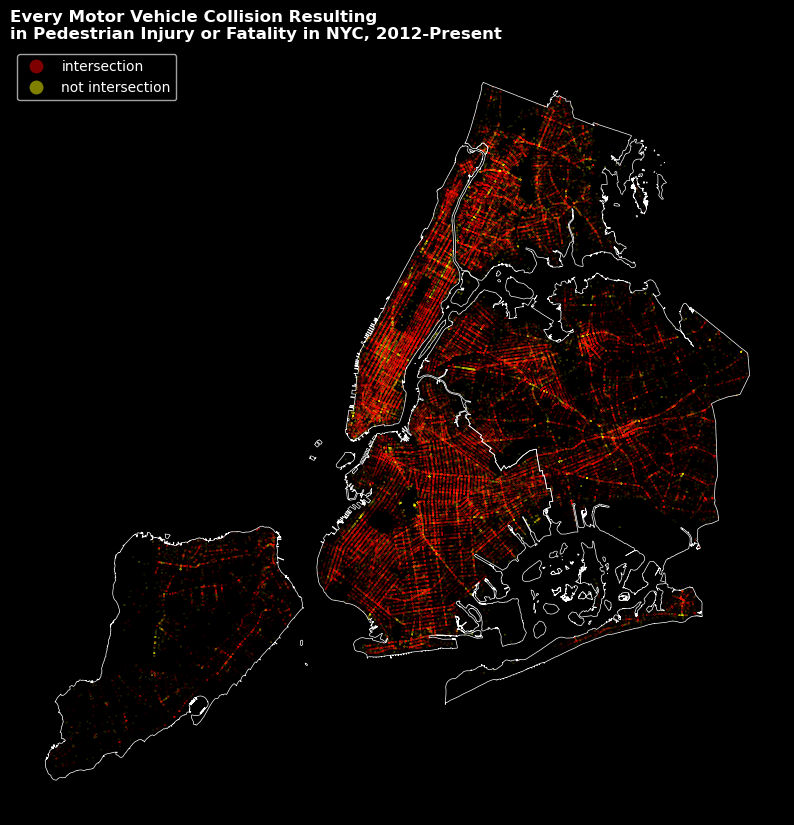

In [143]:

fig, ax = plt.subplots(figsize = (10,10))

crashes_gdf_with_intersection_clipped.plot('intersection', ax = ax, alpha =.5, cmap ='autumn', legend = True,  legend_kwds={
                                                      "loc":'upper left', 'facecolor':'black', 'labelcolor':'white'}, markersize = .01)

nyc_proj.plot(ax = ax, facecolor = 'none', edgecolor = 'white', linewidth = .5)

fig.patch.set_facecolor('black')

ax.axis('off') 



plt.title("Every Motor Vehicle Collision Resulting \nin Pedestrian Injury or Fatality in NYC, 2012-Present", fontsize = 12, loc = 'left', color = 'white', fontweight = 'bold')

fig.savefig('every_collision.jpeg', dpi = 250)

(905464.7390380852, 1075092.8783935553, 112492.57380365508, 280480.09001459694)

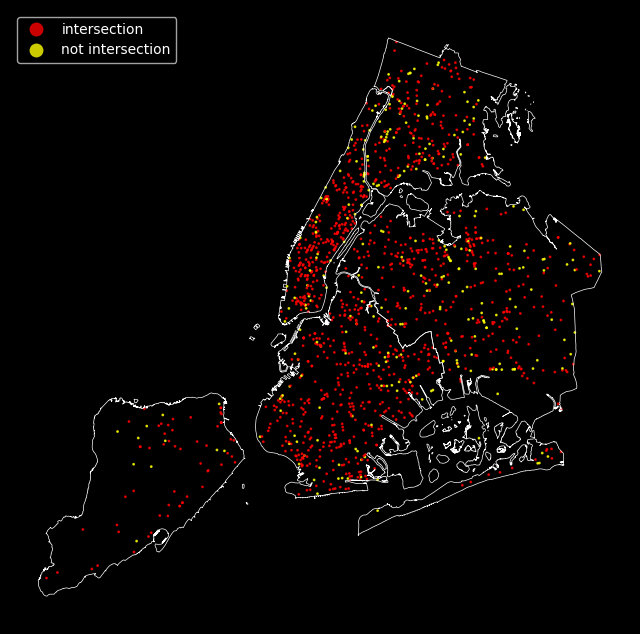

In [34]:

fig, ax = plt.subplots(figsize = (8,8))

crashes_gdf_with_intersection_clipped[crashes_gdf_with_intersection_clipped['NUMBER OF PEDESTRIANS KILLED'] > 0].plot('intersection', ax = ax, alpha =.8, cmap ='autumn', legend = True,  legend_kwds={
                                                      "loc":'upper left', 'facecolor':'black', 'labelcolor':'white'}, markersize = 1)

nyc_proj.plot(ax = ax, facecolor = 'none', edgecolor = 'white', linewidth = .5)

fig.patch.set_facecolor('black')

ax.axis('off') 

## Mapping crash data by intersection
In this section we're doing kind of the reverse - instead of joining our intersections to our crashes, we're joing our crashes to our intersections. 

In [35]:
gdf_nodes_proj

,y,x,ref,highway,street_count,geometry
osmid,,,,,,
39076461,40.786409,-73.794627,33,motorway_junction,3,"POLYGON ((1041152.051 225853.672, 1041151.907 ..."
39076490,40.762429,-73.757091,31W,motorway_junction,3,"POLYGON ((1051570.961 217143.621, 1051570.816 ..."
39076504,40.753467,-73.744164,30W,motorway_junction,3,"POLYGON ((1055161.342 213888.571, 1055161.197 ..."
42421728,40.798048,-73.960044,NaN,traffic_signals,3,"POLYGON ((995342.821 230029.833, 995342.677 23..."
42421731,40.798654,-73.961474,NaN,traffic_signals,4,"POLYGON ((994946.574 230250.589, 994946.430 23..."
...,...,...,...,...,...,...
11543660372,40.739528,-73.974669,NaN,NaN,2,"POLYGON ((991299.747 208707.435, 991299.602 20..."
11546686689,40.859769,-73.802695,NaN,NaN,3,"POLYGON ((1038857.847 252576.075, 1038857.703 ..."
11565186903,40.651292,-73.972558,NaN,NaN,3,"POLYGON ((991894.589 176560.666, 991894.444 17..."


In [36]:
gdf_nodes_proj_with_crashes = gdf_nodes_proj.sjoin(crashes_gdf_proj, how = "left")

In [37]:
gdf_nodes_proj_with_crashes['crash'] = 1

In [38]:
#aggregate to level of individual intersections to find number of crashes and fatalties at each intersection. also use mode to get name of each intersection; this is an imperfect method and I may try to figure out a better way in the future

gdf_nodes_proj_with_crashes_agg = gdf_nodes_proj_with_crashes.groupby('osmid').aggregate({'NUMBER OF PEDESTRIANS INJURED':'sum','NUMBER OF PEDESTRIANS KILLED': 'sum', 'crash': 'sum'})

In [39]:
gdf_nodes_proj_with_crashes_agg

,NUMBER OF PEDESTRIANS INJURED,NUMBER OF PEDESTRIANS KILLED,crash
osmid,,,
39076461,0.0,0.0,1
39076490,0.0,0.0,1
39076504,0.0,0.0,1
42421728,5.0,0.0,5
42421731,6.0,0.0,4
...,...,...,...
11543660372,0.0,0.0,1
11546686689,0.0,0.0,1
11565186903,0.0,0.0,1


In [40]:
#convert to dataframe
nyc_nodes_crashes = pd.DataFrame(gdf_nodes_proj_with_crashes_agg)

In [41]:
nyc_nodes_crashes.head()

,NUMBER OF PEDESTRIANS INJURED,NUMBER OF PEDESTRIANS KILLED,crash
osmid,,,
39076461,0.0,0.0,1
39076490,0.0,0.0,1
39076504,0.0,0.0,1
42421728,5.0,0.0,5
42421731,6.0,0.0,4


In [42]:
gdf_nodes_points = gdf_nodes.to_crs(epsg = 2263)

In [43]:
gdf_nodes_points.head()

,y,x,ref,highway,street_count,geometry
osmid,,,,,,
39076461,40.786409,-73.794627,33,motorway_junction,3,POINT (1041122.051 225853.672)
39076490,40.762429,-73.757091,31W,motorway_junction,3,POINT (1051540.961 217143.621)
39076504,40.753467,-73.744164,30W,motorway_junction,3,POINT (1055131.342 213888.571)
42421728,40.798048,-73.960044,NaN,traffic_signals,3,POINT (995312.821 230029.833)
42421731,40.798654,-73.961474,NaN,traffic_signals,4,POINT (994916.574 230250.589)


In [44]:
#join back to nodes
all_points_with_crashes = gdf_nodes_points.merge(nyc_nodes_crashes, how = 'left', on = 'osmid')

In [45]:
all_points_with_crashes_proj = all_points_with_crashes.to_crs(epsg = 2263)

In [46]:
all_points_with_crashes['NUMBER OF PEDESTRIANS KILLED'].value_counts()

NUMBER OF PEDESTRIANS KILLED
0.0    54133
1.0     1135
2.0       78
3.0        8
4.0        1
5.0        1
Name: count, dtype: int64

In [47]:
import scipy.stats as stats

In [48]:
#rank crashes to get 99 percentile
all_points_with_crashes_proj['rank'] = all_points_with_crashes_proj['crash'].rank(pct = True)

In [49]:
#extract 99th percentile crashes
worst_ints_99 = all_points_with_crashes_proj[all_points_with_crashes_proj['rank'] > .99]

(905464.73902893, 1075092.878585814, 112492.57380365508, 280480.09001459694)

findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=9.0.
findfont: score(FontEntry(fname='/opt/conda/lib/python3.11/site-packages/matplotlib/mpl-data/fonts/ttf/STIXSizOneSymReg.ttf', name='STIXSizeOneSym', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='/opt/conda/lib/python3.11/site-packages/matplotlib/mpl-data/fonts/ttf/STIXSizFourSymReg.ttf', name='STIXSizeFourSym', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='/opt/conda/lib/python3.11/site-packages/matplotlib/mpl-data/fonts/ttf/cmtt10.ttf', name='cmtt10', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='/opt/conda/lib/python3.11/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSans-Oblique.ttf', name='DejaVu Sans', style='oblique', variant='normal', weight=400, stretc

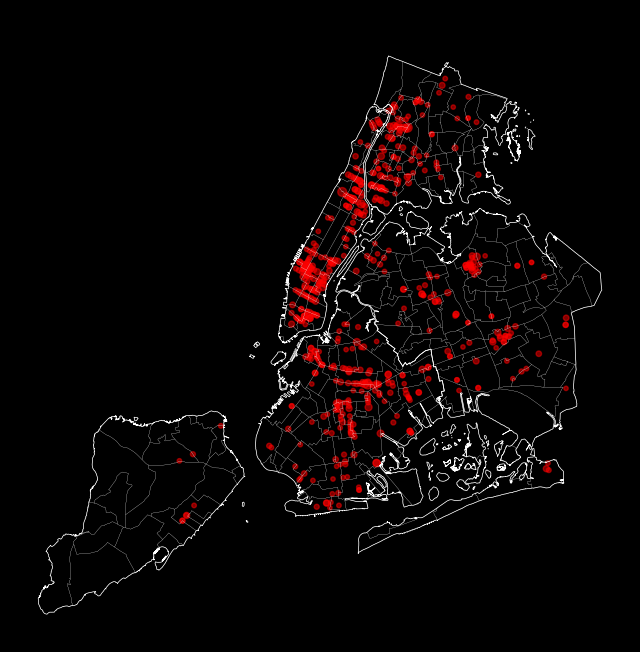

In [53]:
#plot by number of crashes
fig, ax = plt.subplots(figsize = (8,8))

worst_ints_99.plot(ax = ax, color = 'red', alpha = .5, markersize = worst_ints_99['crash']/2, legend = True)
nyc_proj.plot(ax = ax, facecolor = 'none', edgecolor = 'white', linewidth = .5)
nyc_nta_proj.plot(ax = ax, facecolor = 'none', edgecolor = 'white', linewidth = .1)
fig.patch.set_facecolor('black')


plt.title("Every Intersection Symbolized by Number of Serious Pedestrian Incidents, 2012-Present", fontsize = 9)
ax.axis('off')


In [99]:

def plot_boro(df, boro):

    fig, ax = plt.subplots(figsize = (15,15))

    borough = nyc_proj[nyc_proj['boro_name'] == boro]
    
    data = df.clip(borough)

    streets = gdf_edges_proj.clip(borough)

    nta_gdf = nyc_nta_proj.clip(borough)

    data.plot(ax = ax, color = 'red', alpha = .5, markersize = data['crash'], zorder = 2)
    borough.plot(ax = ax, facecolor = 'none', edgecolor = 'white', linewidth = .6, zorder = 3)

    streets.plot(ax = ax, edgecolor = 'white', alpha = .75, linewidth = .4, zorder = 1)
        
    fig.patch.set_facecolor('black')

    plt.title(boro.upper(), fontsize = 12, color = 'white', fontweight = 'bold', pad = 0)
    ax.axis('off')
    fig.savefig(str(boro + '.jpeg'), dpi = 250)


In [91]:
nyc_proj

,boro_code,boro_name,shape_area,shape_leng,geometry
0,5,Staten Island,1623620725.05,325917.35395,"MULTIPOLYGON (((970217.022 145643.332, 970227...."
1,1,Manhattan,636520502.758,357713.308162,"MULTIPOLYGON (((981219.056 188655.316, 980940...."
2,2,Bronx,1187174772.5,463180.579449,"MULTIPOLYGON (((1012821.806 229228.265, 101278..."
3,3,Brooklyn,1934138215.76,728146.574928,"MULTIPOLYGON (((1022227.320 152028.146, 102207..."
4,4,Queens,3041418506.64,888199.731385,"MULTIPOLYGON (((1032452.015 154469.237, 103245..."


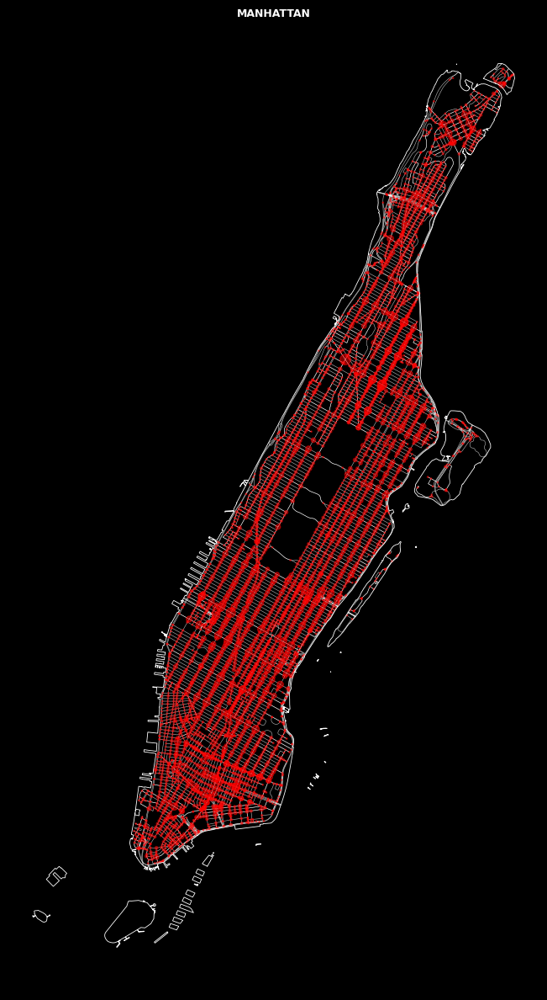

In [98]:
plot_boro(all_points_with_crashes_proj, 'Manhattan')

findfont: Matching sans\-serif:style=normal:variant=normal:weight=bold:stretch=normal:size=12.0.
findfont: score(FontEntry(fname='/opt/conda/lib/python3.11/site-packages/matplotlib/mpl-data/fonts/ttf/STIXSizOneSymReg.ttf', name='STIXSizeOneSym', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='/opt/conda/lib/python3.11/site-packages/matplotlib/mpl-data/fonts/ttf/STIXSizFourSymReg.ttf', name='STIXSizeFourSym', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='/opt/conda/lib/python3.11/site-packages/matplotlib/mpl-data/fonts/ttf/cmtt10.ttf', name='cmtt10', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='/opt/conda/lib/python3.11/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSans-Oblique.ttf', name='DejaVu Sans', style='oblique', variant='normal', weight=400, stre

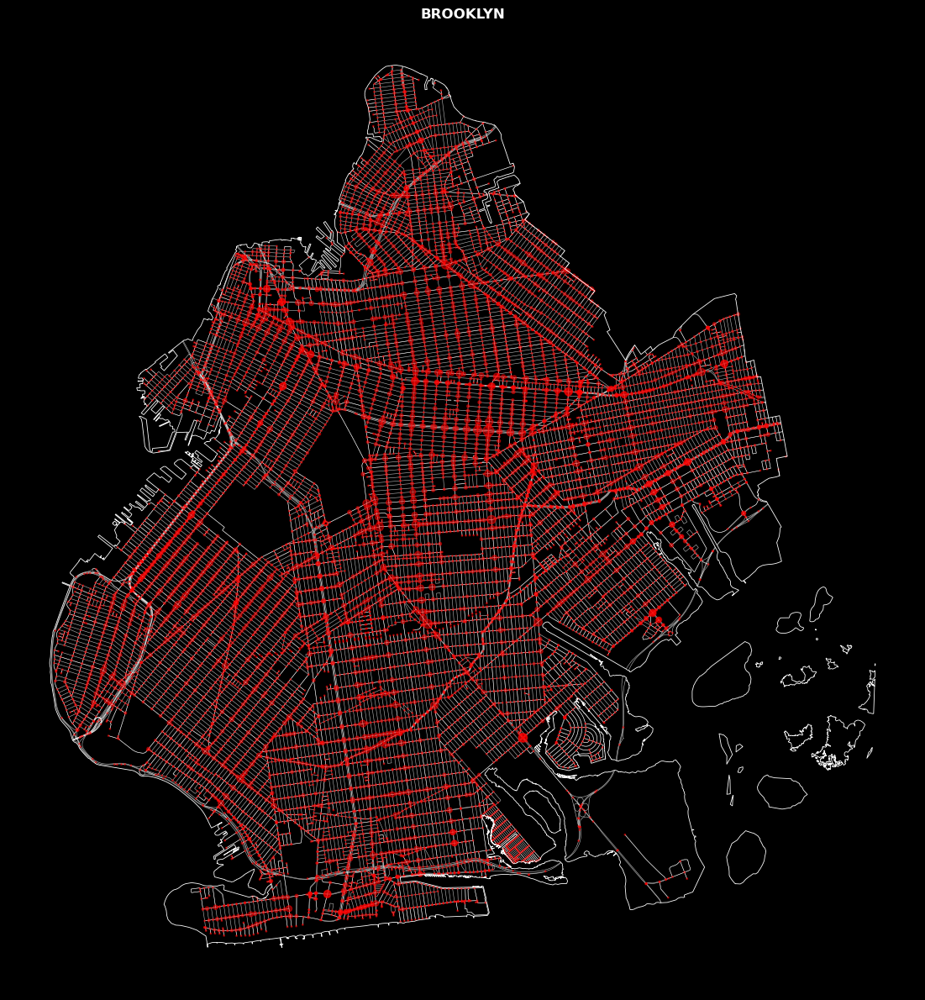

In [100]:
plot_boro(all_points_with_crashes_proj, 'Brooklyn')

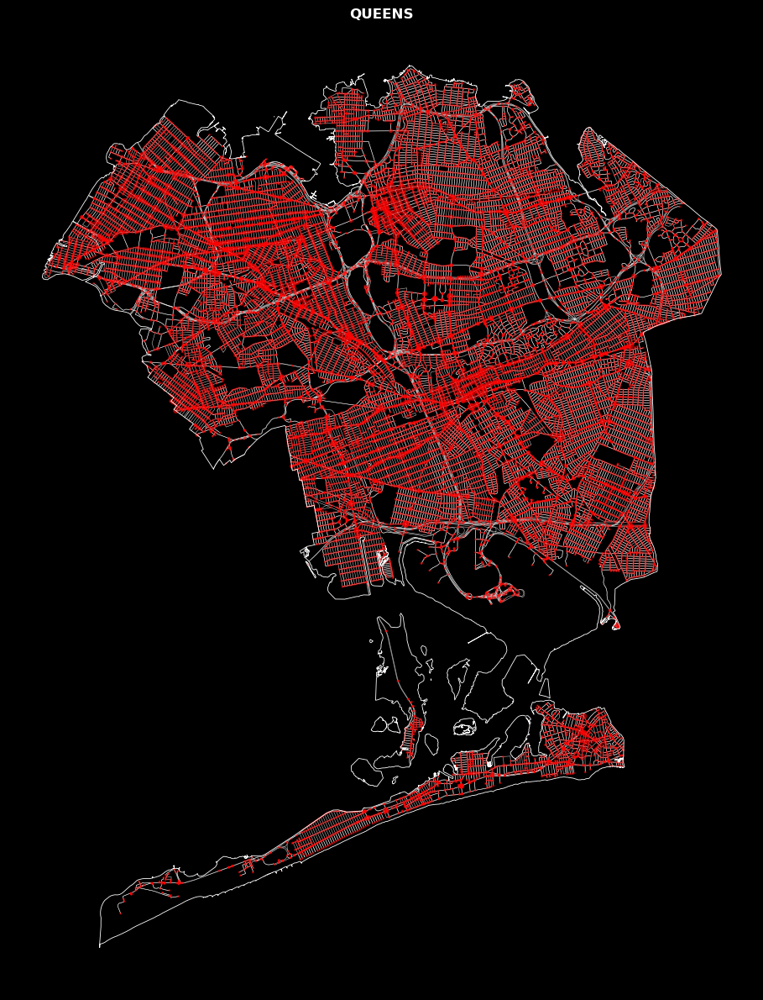

In [101]:
plot_boro(all_points_with_crashes_proj, 'Queens')


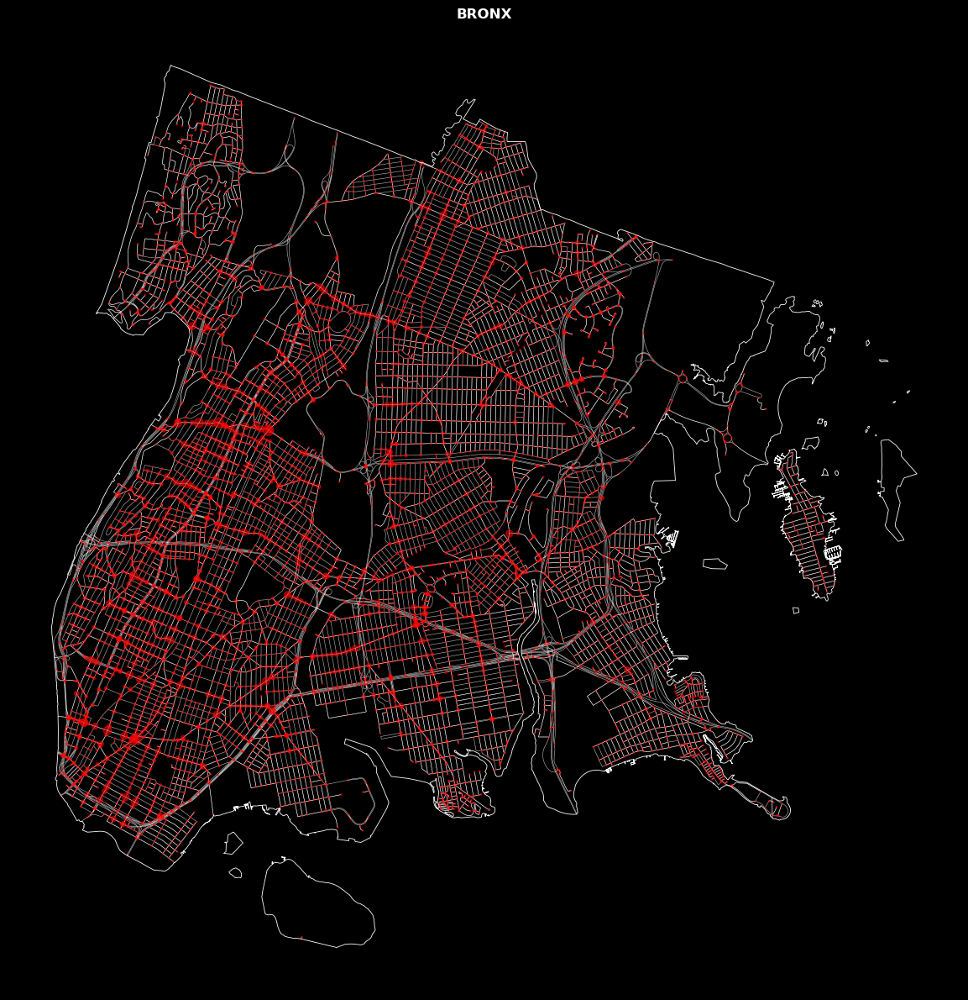

In [102]:
plot_boro(all_points_with_crashes_proj, 'Bronx')


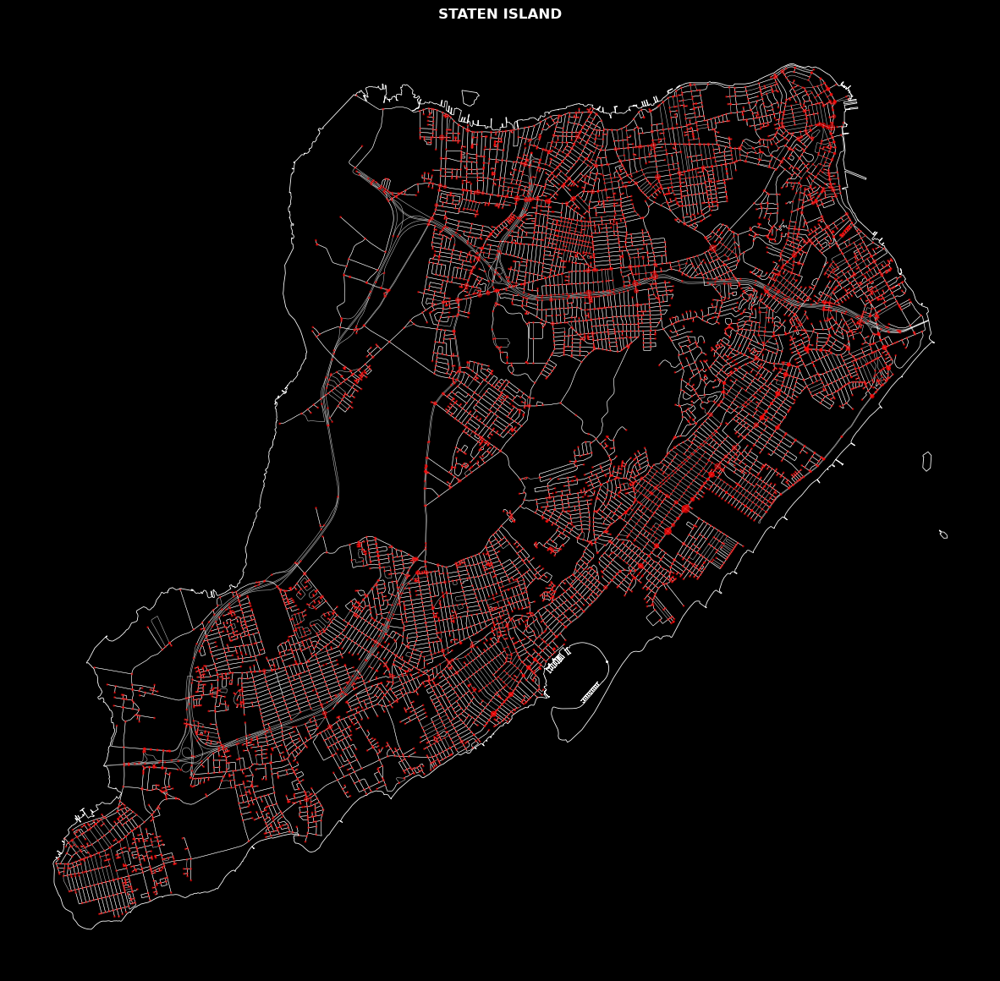

In [103]:
plot_boro(all_points_with_crashes_proj, 'Staten Island')

## Reverse geocoding to get intersection names

In [104]:
from arcgis.geocoding import reverse_geocode

In [105]:
input_rows_geocoded = []

for idx, int in worst_ints_99.iterrows():
        int_geocoded = int
        reversegeocodeoutput = reverse_geocode([int['x'], int['y']], return_intersection = True)
        int_geocoded['int_name'] = reversegeocodeoutput['address']['ShortLabel'] 
        int_geocoded['neighborhoood'] = reversegeocodeoutput['address']['Neighborhood'] 
        int_geocoded['borough'] = reversegeocodeoutput['address']['District'] 
        input_rows_geocoded.append(int_geocoded)


https://geocode.arcgis.com:443 "POST /arcgis/rest/services/World/GeocodeServer/reverseGeocode HTTP/1.1" 200 373
https://geocode.arcgis.com:443 "POST /arcgis/rest/services/World/GeocodeServer/reverseGeocode HTTP/1.1" 200 383
https://geocode.arcgis.com:443 "POST /arcgis/rest/services/World/GeocodeServer/reverseGeocode HTTP/1.1" 200 383
https://geocode.arcgis.com:443 "POST /arcgis/rest/services/World/GeocodeServer/reverseGeocode HTTP/1.1" 200 368
https://geocode.arcgis.com:443 "POST /arcgis/rest/services/World/GeocodeServer/reverseGeocode HTTP/1.1" 200 374
https://geocode.arcgis.com:443 "POST /arcgis/rest/services/World/GeocodeServer/reverseGeocode HTTP/1.1" 200 368
https://geocode.arcgis.com:443 "POST /arcgis/rest/services/World/GeocodeServer/reverseGeocode HTTP/1.1" 200 369
https://geocode.arcgis.com:443 "POST /arcgis/rest/services/World/GeocodeServer/reverseGeocode HTTP/1.1" 200 371
https://geocode.arcgis.com:443 "POST /arcgis/rest/services/World/GeocodeServer/reverseGeocode HTTP/1.1" 

In [107]:
worst_ints_99_with_names = gpd.GeoDataFrame(input_rows_geocoded, geometry = worst_ints_99['geometry'], crs = 2263)

In [108]:
worst_ints_99_with_names

,y,x,ref,highway,street_count,geometry,NUMBER OF PEDESTRIANS INJURED,NUMBER OF PEDESTRIANS KILLED,crash,rank,int_name,neighborhoood,borough
42423020,40.746079,-73.974938,NaN,traffic_signals,5,POINT (991194.326 211094.407),24.0,0.0,23,0.993479,2nd Ave & E 36th St,Murray Hill,Manhattan
42427133,40.840194,-73.943068,NaN,traffic_signals,4,POINT (1000002.899 245387.848),31.0,0.0,30,0.996866,W 165th St & Fort Washington Ave,Washington Heights South,Manhattan
42427190,40.850909,-73.938284,NaN,traffic_signals,4,POINT (1001323.926 249292.586),20.0,0.0,20,0.990471,W 181st St & Fort Washington Ave,Washington Heights North,Manhattan
42427316,40.718016,-73.999955,NaN,traffic_signals,4,POINT (984262.363 200869.111),22.0,2.0,22,0.992611,Canal St & Centre St,Chinatown,Manhattan
42427358,40.720650,-73.981345,NaN,traffic_signals,4,POINT (989420.988 201829.163),28.0,0.0,27,0.995845,E Houston St & Pitt St,Lower East Side,Manhattan
...,...,...,...,...,...,...,...,...,...,...,...,...,...
11162133991,40.683580,-73.975952,NaN,NaN,3,POINT (990919.664 188323.857),27.0,0.0,27,0.995845,Atlantic Ave & Fort Greene Pl,Fort Greene,Brooklyn
11309164957,40.703318,-73.796094,NaN,traffic_signals,4,POINT (1040786.415 195580.024),24.0,0.0,24,0.994165,93rd Ave & Guy R Brewer Blvd,Jamaica,Queens
11337295604,40.751448,-73.976049,NaN,NaN,4,POINT (990886.139 213050.383),37.0,0.0,30,0.996866,E 42nd St & Lexington Ave,Midtown Center,Manhattan
11337295608,40.750765,-73.974457,NaN,NaN,4,POINT (991327.052 212801.487),37.0,0.0,36,0.998636,3rd Ave & E 42nd St,Midtown Center,Manhattan


## Charting the worst intersections in New York

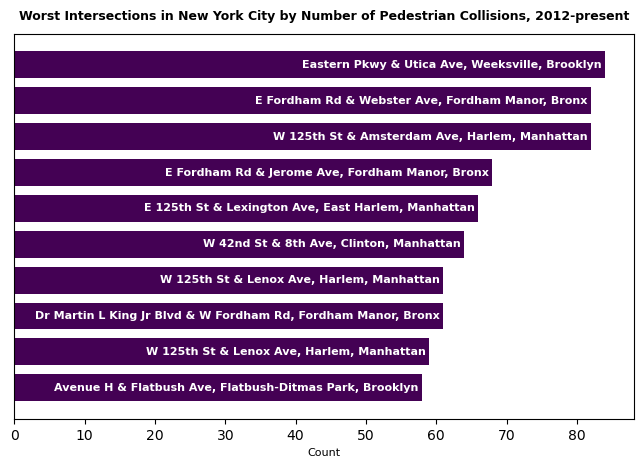

In [127]:
df = worst_ints_99_with_names.sort_values(by='crash', ascending=False).head(10)

df = df.reset_index()
fig, ax = plt.subplots(figsize=(8,5))

ax.barh(df['crash'].index[::-1], df['crash'], height=0.75, color="#440154")

label = 'Worst Intersections in New York City by Number of Pedestrian Collisions, 2012-present'
plt.yticks([])
plt.title(label, fontsize=9, pad=10, fontweight = 'bold')
plt.xlabel('Count', fontsize=8)

for i, row in df.iterrows():
    ax.text(row['crash'] -.5, 9-i, str(row['int_name'] + "," + " " + row['neighborhoood'] + "," + " " + row['borough']), color='white', fontweight = 'bold', fontsize=8, ha='right', va='center')

## Making an Interactive Map of the Worst Intersections

These maps give us a general sense of where the worst intersections are, but we might like to know more detailed information about each intersection. Because of the quantity of information we will have to do this with an interactive map. This map can become a helpful tool for prioritizing intersections. I'm also going to add a layer of all pedestrian fatalities to this map because of how important they are to Vision Zero.

In [111]:
worst_ints_99_with_names.dtypes

y                                 float64
x                                 float64
ref                               float64
highway                            object
street_count                        int64
geometry                         geometry
NUMBER OF PEDESTRIANS INJURED     float64
NUMBER OF PEDESTRIANS KILLED      float64
crash                               int64
rank                              float64
int_name                           object
neighborhoood                      object
borough                            object
dtype: object

In [112]:
import numpy as np

In [113]:
#create variables for 99.5 and 99.9 percentile

worst_ints_99_with_names['percentile_995'] = np.where(worst_ints_99_with_names['rank'] >= .995, 'YES', 'NO')
worst_ints_99_with_names['percentile_999'] = np.where(worst_ints_99_with_names['rank'] >= .999, 'YES', 'NO')

In [114]:
worst_ints_99_with_names.crs

<Projected CRS: EPSG:2263>
Name: NAD83 / New York Long Island (ftUS)
Axis Info [cartesian]:
- X[east]: Easting (US survey foot)
- Y[north]: Northing (US survey foot)
Area of Use:
- name: United States (USA) - New York - counties of Bronx; Kings; Nassau; New York; Queens; Richmond; Suffolk.
- bounds: (-74.26, 40.47, -71.8, 41.3)
Coordinate Operation:
- name: SPCS83 New York Long Island zone (US Survey feet)
- method: Lambert Conic Conformal (2SP)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [115]:
#project to wgs for web mapping
worst_ints_99_with_names_wgs = worst_ints_99_with_names.to_crs(epsg = 4326)

PROJ_ERROR: hgridshift: could not find required grid(s).
PROJ_ERROR: pipeline: Pipeline: Bad step definition: proj=hgridshift (File not found or invalid)
PROJ_ERROR: hgridshift: could not find required grid(s).
PROJ_ERROR: pipeline: Pipeline: Bad step definition: proj=hgridshift (File not found or invalid)
PROJ_ERROR: hgridshift: could not find required grid(s).
PROJ_ERROR: pipeline: Pipeline: Bad step definition: proj=hgridshift (File not found or invalid)


In [116]:
worst_ints_99_with_names_wgs = worst_ints_99_with_names_wgs.reset_index()

In [117]:
worst_ints_99_with_names_wgs.dtypes

index                               int64
y                                 float64
x                                 float64
ref                               float64
highway                            object
street_count                        int64
geometry                         geometry
NUMBER OF PEDESTRIANS INJURED     float64
NUMBER OF PEDESTRIANS KILLED      float64
crash                               int64
rank                              float64
int_name                           object
neighborhoood                      object
borough                            object
percentile_995                     object
percentile_999                     object
dtype: object

In [118]:
#make list of worst intersections coords for placing markers on the folium map
worst_intersections_list = [[point.xy[1][0], point.xy[0][0]] for point in worst_ints_99_with_names_wgs.geometry]

In [133]:
crashes_gdf_fatal = crashes_gdf[crashes_gdf['NUMBER OF PEDESTRIANS KILLED'] > 0]

In [135]:
crashes_gdf_fatal = crashes_gdf_fatal.reset_index()

In [138]:
fatalities_list = [[point.xy[1][0], point.xy[0][0]] for point in crashes_gdf_fatal.geometry]

In [139]:
fatalities_list

[[40.720535, -73.88885],
 [40.84036, -73.91807],
 [40.620487, -74.029305],
 [40.782463, -73.97883],
 [40.774807, -73.98442],
 [40.770527, -73.98012],
 [40.80574, -73.942764],
 [40.684204, -73.96806],
 [40.82289, -73.94208],
 [40.631590006236, -73.947539997263],
 [40.677746, -73.73096],
 [40.675716, -73.9142],
 [40.7423, -73.781235],
 [40.61424, -73.98824],
 [40.563915, -74.11637],
 [40.77437, -73.963554],
 [40.820435, -73.93623],
 [40.66675, -73.779945],
 [40.74681, -73.89176],
 [40.737019994174, -73.97462997305],
 [40.65461, -73.922],
 [40.748066, -73.84918],
 [40.65414, -73.88732],
 [40.720795, -73.94496],
 [40.683122834319, -73.854231948493],
 [40.63926, -73.93777],
 [40.59783, -73.96549],
 [40.8337, -73.879845],
 [40.760310013201, -73.774310030869],
 [40.681515, -73.90412],
 [40.7104, -73.86663],
 [40.762802, -73.965675],
 [40.847410015225, -73.899670026218],
 [40.839237, -73.94688],
 [40.74331, -73.87451],
 [40.83232, -73.87395],
 [40.777958, -73.90847],
 [40.686085, -73.982666],


In [140]:
m = folium.Map(location=[40.65, -73.95], zoom_start=12, tiles='CartoDB positron')


for i in range(len(worst_intersections_list)):
    m.add_child(
    folium.CircleMarker(location=worst_intersections_list[i],
                        radius=(worst_ints_99_with_names_wgs.crash[i]/2),
                        color = "red",
                        fill=True, 
                        fill_color="red",
                        tooltip =  str(worst_ints_99_with_names_wgs.int_name[i]),
                       popup = folium.Popup("<br><b>Total Pedestrian Injuries:</b>" + " " + str(worst_ints_99_with_names_wgs['NUMBER OF PEDESTRIANS INJURED'][i])
                                             + "<br><b>Total Pedestrian Fatalities:</b>" + " " + str(worst_ints_99_with_names_wgs['NUMBER OF PEDESTRIANS KILLED'][i]) +
                                            "<br><b>99.5 percentile:</b>" + " " + str(worst_ints_99_with_names_wgs['percentile_995'][i]) + 
                                             "<br><b>99.9 percentile:</b>" + " " + str(worst_ints_99_with_names_wgs['percentile_999'][i]),
                       max_width=len(f"name= {worst_ints_99_with_names_wgs['NUMBER OF PEDESTRIANS INJURED'][i]}")*20)))

for i in range(len(fatalities_list)):
    m.add_child(
        folium.Circle(location = fatalities_list[i],
                      radius = 5,
                      color = "black",
                      fill = True,
                      fill_color = "black",
                      tooltip = str(crashes_gdf_fatal['CRASH DATE'][i]),
                     popup = folium.Popup("<br><b>Accident Date:</b>" + "\n" + str(crashes_gdf_fatal['CRASH DATE'][i] + "\n" )
                                         + "<br><b>Accident Time:</b>" + "\n" + str(crashes_gdf_fatal['CRASH TIME'][i])
                                         + "<br><b>Reason for Accident:</b>" +  "\n" + str(crashes_gdf_fatal['CONTRIBUTING FACTOR VEHICLE 1'][i])
                                          + "<br><b>Number of Pedestrian Fatalities:</b>" + "\n" + str(crashes_gdf_fatal['NUMBER OF PEDESTRIANS KILLED'][i])
                                          + "<br><b>Number of Pedestrian Injuries:</b>" + "\n" + str(crashes_gdf_fatal['NUMBER OF PEDESTRIANS INJURED'][i]), 
                                         max_width=len(f"name= {crashes_gdf_fatal['CONTRIBUTING FACTOR VEHICLE 1'][i]}")*20)))

m

In [120]:
#m = folium.Map(location=[40.65, -73.95], zoom_start=12, tiles='CartoDB positron')


#folium.Choropleth(
    #geo_data=geo,
    #name="choropleth",
    #data=tracts_with_vehicle_avail_webm,
    #columns=["GEOID20", "percent_without_vehicle"], # join key comes first, then the variable you're visualizing (first needs to be a string, second a number)
    #key_on="feature.id",
    #fill_color="YlGnBu",
    #fill_opacity=0.7,
    #line_opacity=0.2,
    #legend_name="% without vehicle").add_to(m)



#for i in range(len(worst_intersections_list)):
    #m.add_child(
    #folium.CircleMarker(location=worst_intersections_list[i],
                        #radius=(bk_ints_top.crash[i]/2),
                        #color = "red",
                        #fill=True, 
                        #fill_color="red",
                        #tooltip =  str(bk_ints_top['ON STREET NAME'][i]) + "&" + "\n" + str(bk_ints_top['CROSS STREET NAME'][i]),
                       #popup = folium.Popup("<br><b>Pedestrian Incidents:</b>" + str(bk_ints_top.str_crashes[i])
                                             #+ "<br><b>Fatal Pedestrian Incidents:</b>" + str(bk_ints_top.fatal[i].astype(int)))))

#for i in range(len(fatalities_list)):
    #m.add_child(
        #folium.Circle(location = fatalities_list[i],
                      #radius = 5,
                      #color = "black",
                      #fill = True,
                      #fill_color = "black",
                      #tooltip = str(bk_pedestrian_fatalities_webm['ON STREET NAME'][i]) + "&" + "\n" + str(bk_pedestrian_fatalities_webm['CROSS STREET NAME'][i]),
                     #popup = folium.Popup("<br><b>Accident Date:</b>" + "\n" + str(bk_pedestrian_fatalities_webm['CRASH DATE'][i] + "\n" )
                                         #+ "<br><b>Accident Time:</b>" + "\n" + str(bk_pedestrian_fatalities_webm['CRASH TIME'][i])
                                         #+ "<br><b>Reason for Accident:</b>" +  "\n" + str(bk_pedestrian_fatalities_webm['CONTRIBUTING FACTOR VEHICLE 1'][i])
                                          #+ "<br><b>Number of Pedestrian Fatalities:</b>" + "\n" + str(bk_pedestrian_fatalities_webm['NUMBER OF PEDESTRIANS KILLED'][i])
                                          #+ "<br><b>Number of Pedestrian Injuries:</b>" + "\n" + str(bk_pedestrian_fatalities_webm['NUMBER OF PEDESTRIANS INJURED'][i]), 
                                         #max_width=len(f"name= {bk_pedestrian_fatalities_webm['CONTRIBUTING FACTOR VEHICLE 1'][i]}")*20)))
             
#folium.LayerControl().add_to(m)
                   
#m

In [121]:
#m.save('bk_accidents.html')